<a href="https://colab.research.google.com/github/emrizky1/PCVK_Ganjil_2026/blob/main/Week_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
import cv2 as cv
import numpy as np
import pandas as pd
from google.colab.patches import cv2_imshow

drive.mount('/content/drive')

Mounted at /content/drive


Mengubah tingkat kecerahan citra
--------------------------------
Masukkan nilai kecerahan: 50


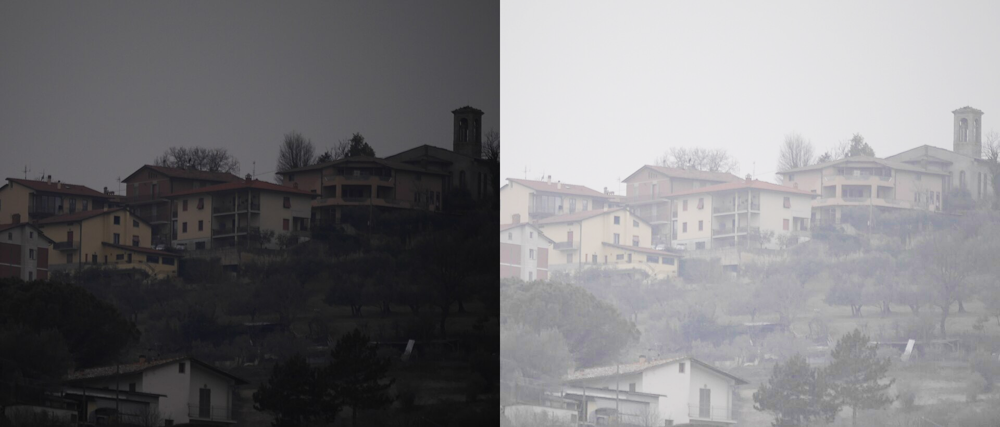

In [39]:
print('Mengubah tingkat kecerahan citra')
print('--------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/houses.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      val = brightness * np.log(1 + float(original[y, x, c]))
      brightness_image[y, x, c] = np.clip(val, 0, 255)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

Inverse
-------


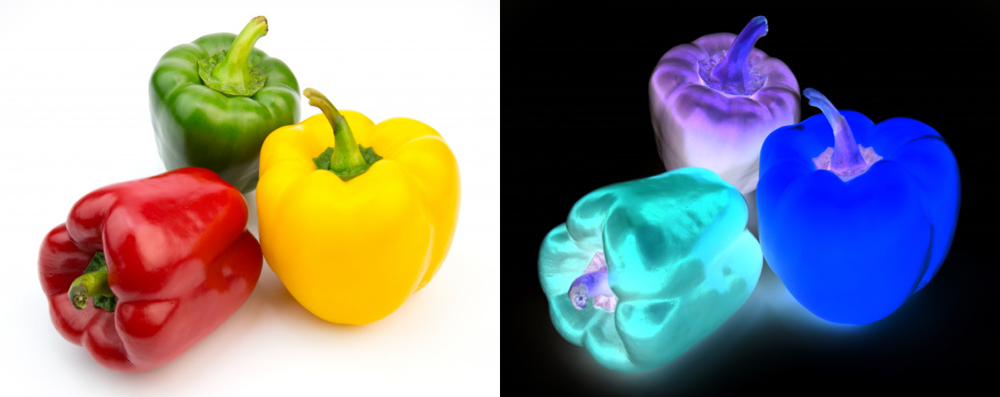

In [ ]:
print('Inverse')
print('-------')

original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/peppers.jpg')
inverse_image = 255 - original

final_frame = cv.hconcat((original, inverse_image))
cv2_imshow(final_frame)

Mengubah kontras dan tingkat kecerahan citra
--------------------------------------------
Masukkan nilai kecerahan: 10
Masukkan kontras: 1.5


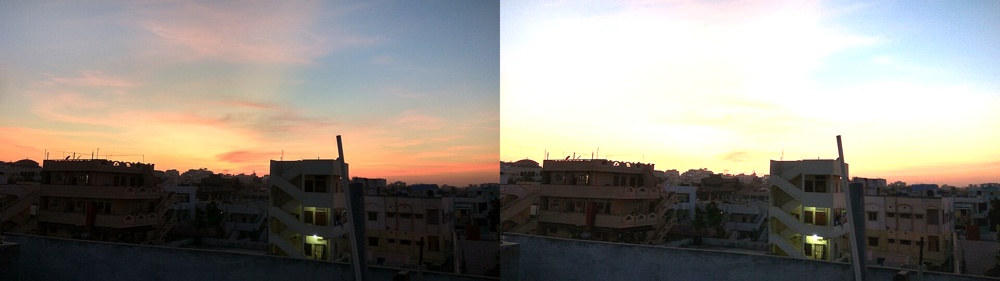

In [36]:
print('Mengubah kontras dan tingkat kecerahan citra')
print('--------------------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
  contrast = float(input('Masukkan kontras: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/sunset.jpg')
contrast_brightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      contrast_brightness_image[y, x, c] = np.clip(contrast * original[y, x, c] + brightness, 0, 255)

final = cv.hconcat((original, contrast_brightness_image))
cv2_imshow(final)

Averaging
-------


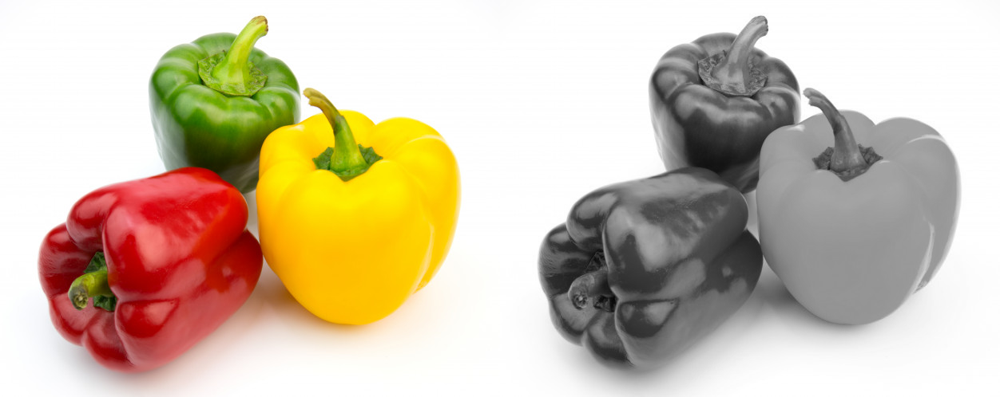

In [ ]:
print('Averaging')
print('-------')

original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/peppers.jpg')
averaging_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    b = int(original[y, x, 0])
    g = int(original[y, x, 1])
    r = int(original[y, x, 2])

    avg = ((b + g + r) / 3)

    averaging_image[y, x, 0] = avg
    averaging_image[y, x, 1] = avg
    averaging_image[y, x, 2] = avg

final_frame = cv.hconcat((original, averaging_image))
cv2_imshow(final_frame)

Lightness
-------


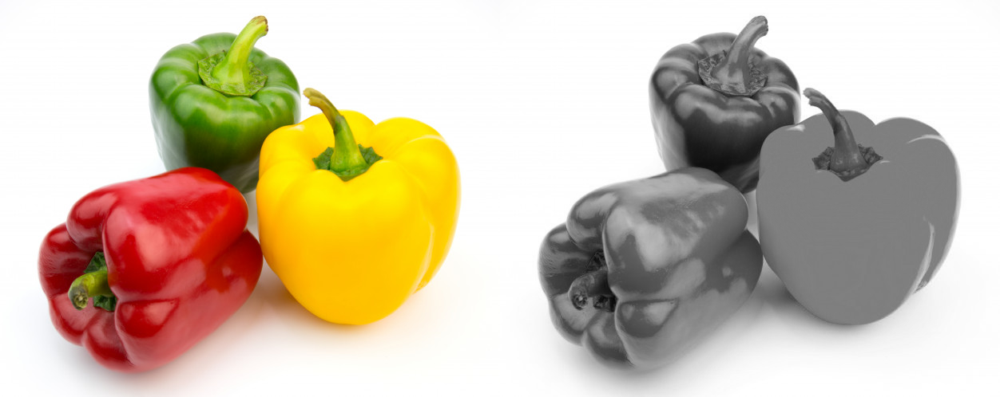

In [ ]:
print('Lightness')
print('-------')

original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/peppers.jpg')
lightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    b = int(original[y, x, 0])
    g = int(original[y, x, 1])
    r = int(original[y, x, 2])

    lightness = ((max(b, g, r) + min(b, g, r)) / 2)

    lightness_image[y, x, 0] = lightness
    lightness_image[y, x, 1] = lightness
    lightness_image[y, x, 2] = lightness

final_frame = cv.hconcat((original, lightness_image))
cv2_imshow(final_frame)

Luminance
-------


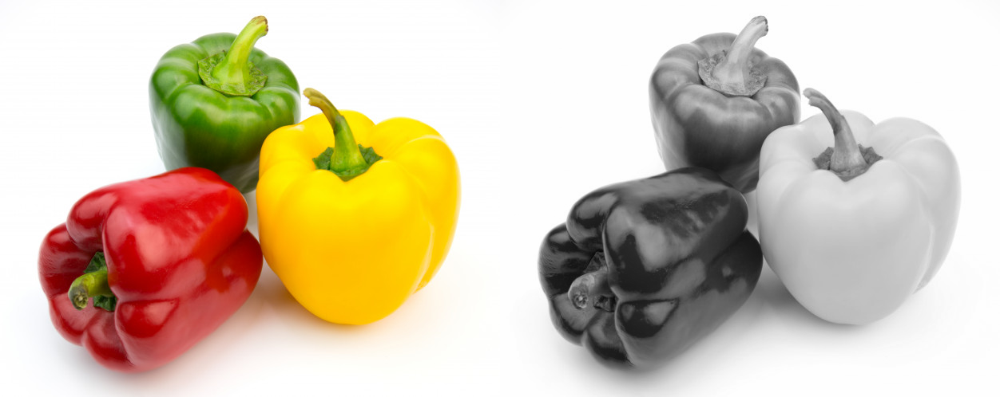

In [ ]:
print('Luminance')
print('-------')

original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/peppers.jpg')
luminance_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    b = int(original[y, x, 0])
    g = int(original[y, x, 1])
    r = int(original[y, x, 2])

    luminance = 0.21 * r + 0.72 * g + 0.07 * b

    luminance_image[y, x, 0] = luminance
    luminance_image[y, x, 1] = luminance
    luminance_image[y, x, 2] = luminance

final_frame = cv.hconcat((original, luminance_image))
cv2_imshow(final_frame)

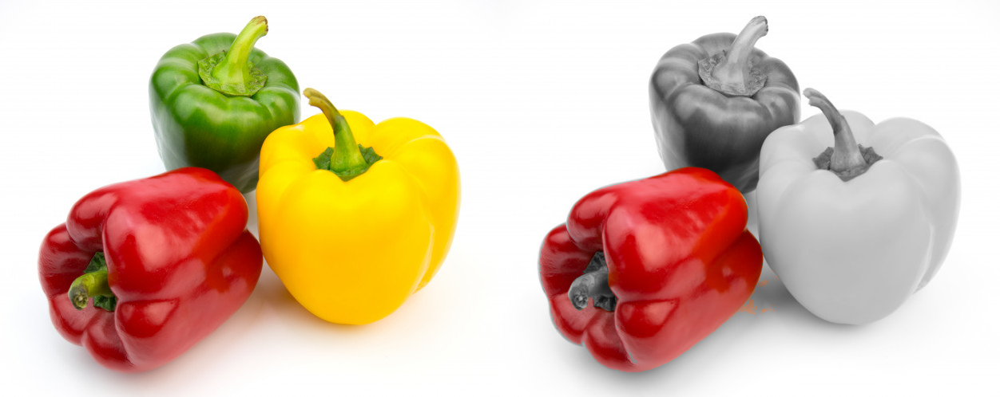

In [23]:
original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/peppers.jpg')

hsv = cv.cvtColor(original, cv.COLOR_BGR2HSV)

lower_red1 = np.array([0, 100, 50])
upper_red1 = np.array([10, 255, 255])
lower_red2 = np.array([170, 100, 50])
upper_red2 = np.array([180, 255, 255])

mask1 = cv.inRange(hsv, lower_red1, upper_red1)
mask2 = cv.inRange(hsv, lower_red2, upper_red2)
mask_red = mask1 | mask2

gray = cv.cvtColor(original, cv.COLOR_BGR2GRAY)
gray_3channel = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

output_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    if mask_red[y, x] > 0:
      output_image[y, x] = original[y, x]
    else:
      output_image[y, x] = gray_3channel[y, x]

final_frame = cv.hconcat((original, output_image))
cv2_imshow(final_frame)

 Gamma Correction pada citra 
-----------------------------
Masukkan nilai gamma: 0.5


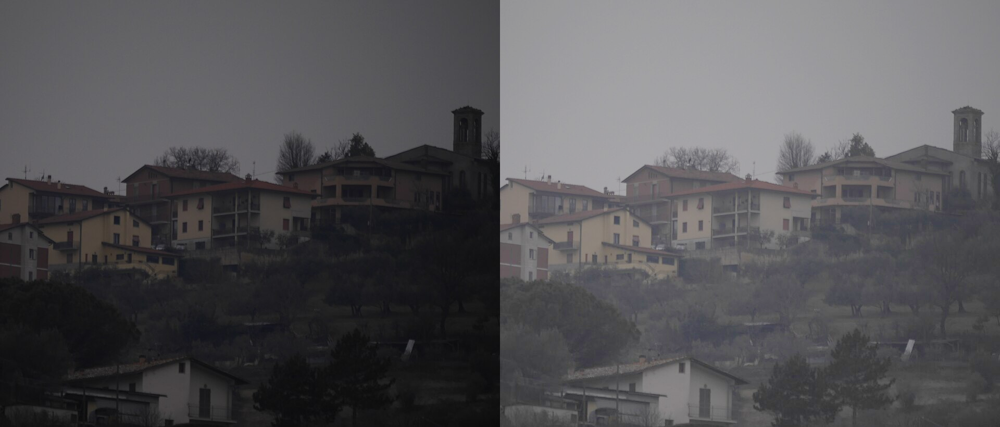

In [26]:
print(' Gamma Correction pada citra ')
print('-----------------------------')
try:
  gamma = float(input('Masukkan nilai gamma: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/houses.jpg')
gamma_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      val = 255 * ((original[y, x, c] / 255) ** gamma)
      gamma_image[y, x, c] = np.clip(val, 0, 255)

final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

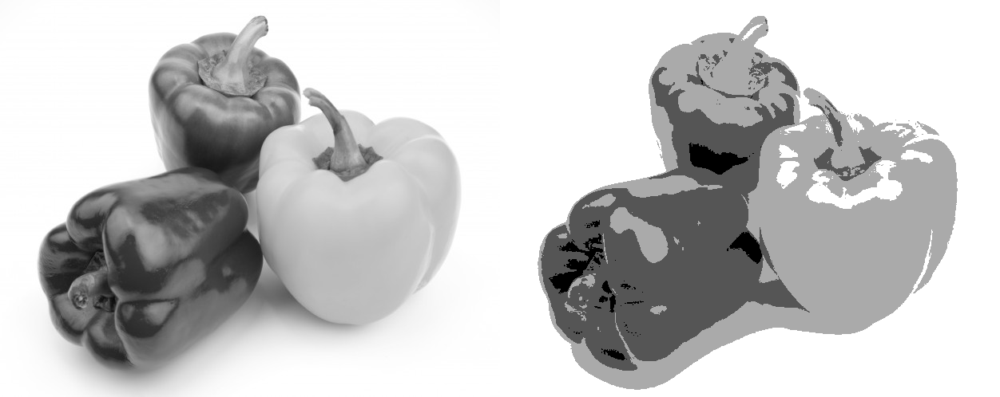

In [29]:
bit_depth = 2
level = 255 / (pow(2,bit_depth)-1)
original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/peppers.jpg', cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    c_val = original[y, x]
    depth_image[y, x] = round(c_val / level) * level

final_frame = cv.hconcat((original, depth_image))
cv2_imshow(final_frame)

Total gambar terbaca: 100

--- Hasil Uji Average Denoising ---
Jumlah Citra:  10 | Nilai PSNR: 19.74 dB


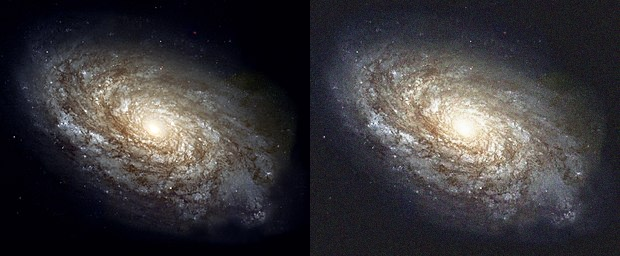

Jumlah Citra:  20 | Nilai PSNR: 19.84 dB


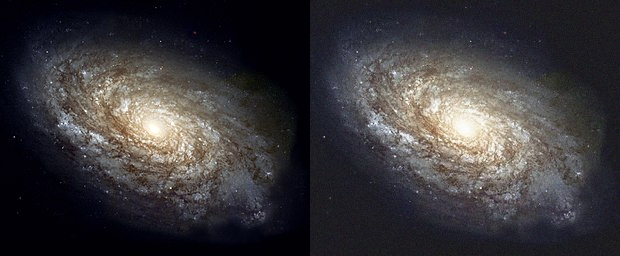

Jumlah Citra:  40 | Nilai PSNR: 19.89 dB


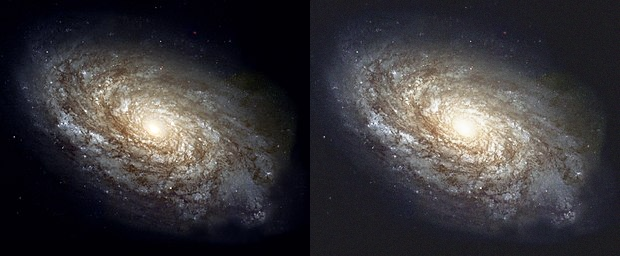

Jumlah Citra:  80 | Nilai PSNR: 19.92 dB


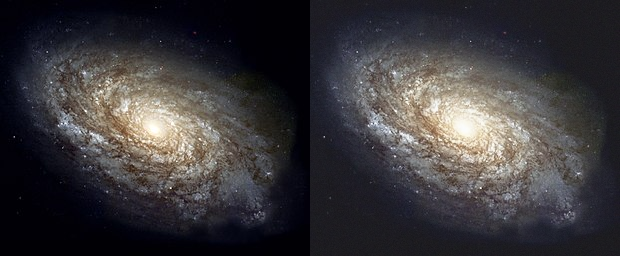

Jumlah Citra: 100 | Nilai PSNR: 19.92 dB


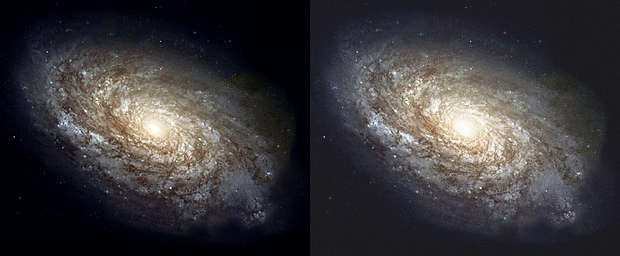

In [32]:
import glob
from math import sqrt

def PSNR(img1, img2):
  mse = np.mean((img1.astype("float") - img2.astype("float")) ** 2)
  if mse == 0:
    return 100
  max_pixel = 255.0
  psnr = 20 * np.log10(max_pixel / sqrt(mse))
  return psnr

original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/galaxy.jpg')

cv_img = []
for img_path in sorted(glob.glob('/content/drive/MyDrive/pcvk_2026/Images/noises/*.jpg')):
  n = cv.imread(img_path)
  if n is not None:
    cv_img.append(n)

print(f"Total gambar terbaca: {len(cv_img)}")

target_counts = [10, 20, 40, 80, 100]

print("\n--- Hasil Uji Average Denoising ---")
for count in target_counts:
  selected_imgs = cv_img[:count]

  avg_img = np.mean(selected_imgs, axis=0).astype(np.uint8)

  psnr_val = PSNR(original, avg_img)
  print(f"Jumlah Citra: {count:3d} | Nilai PSNR: {psnr_val:.2f} dB")

  final_frame = cv.hconcat((original, avg_img))
  cv2_imshow(final_frame)

--- Citra Input & Masker ---


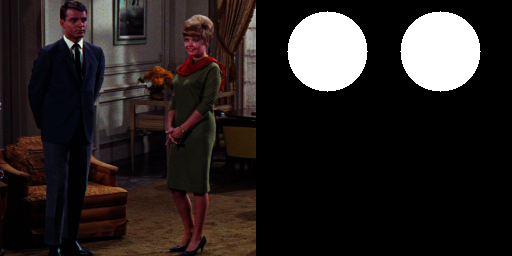

--- Hasil Operasi Logika ---
1. NOT:


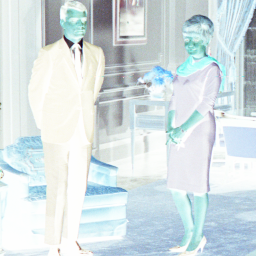

2. OR:


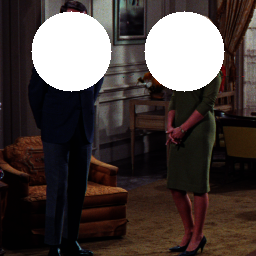

3. AND:


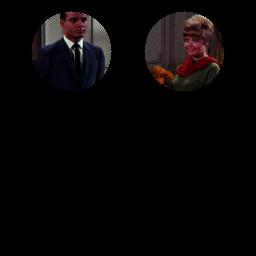

4. NAND:


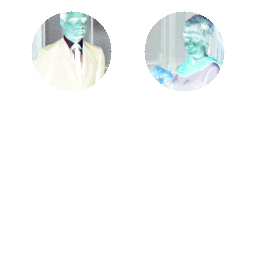

5. XOR:


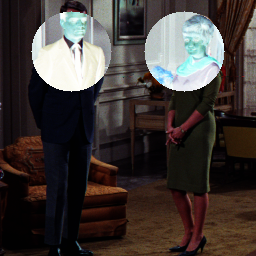

In [33]:
original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/couple.tiff')

h, w = original.shape[:2]

mask = np.zeros((h, w, 3), dtype=np.uint8)

r = int(w * 0.16)
center1 = (int(w * 0.28), int(h * 0.20))
center2 = (int(w * 0.72), int(h * 0.20))

cv.circle(mask, center1, r, (255, 255, 255), -1)
cv.circle(mask, center2, r, (255, 255, 255), -1)

out_not = cv.bitwise_not(original)

out_or = cv.bitwise_or(original, mask)

out_and = cv.bitwise_and(original, mask)

out_nand = cv.bitwise_not(out_and)

out_xor = cv.bitwise_xor(original, mask)

print("--- Citra Input & Masker ---")
input_frame = cv.hconcat((original, mask))
cv2_imshow(input_frame)

print("--- Hasil Operasi Logika ---")
print("1. NOT:")
cv2_imshow(out_not)

print("2. OR:")
cv2_imshow(out_or)

print("3. AND:")
cv2_imshow(out_and)

print("4. NAND:")
cv2_imshow(out_nand)

print("5. XOR:")
cv2_imshow(out_xor)

 Gamma Correction pada citra 
-----------------------------
Masukkan nilai gamma: 0.5


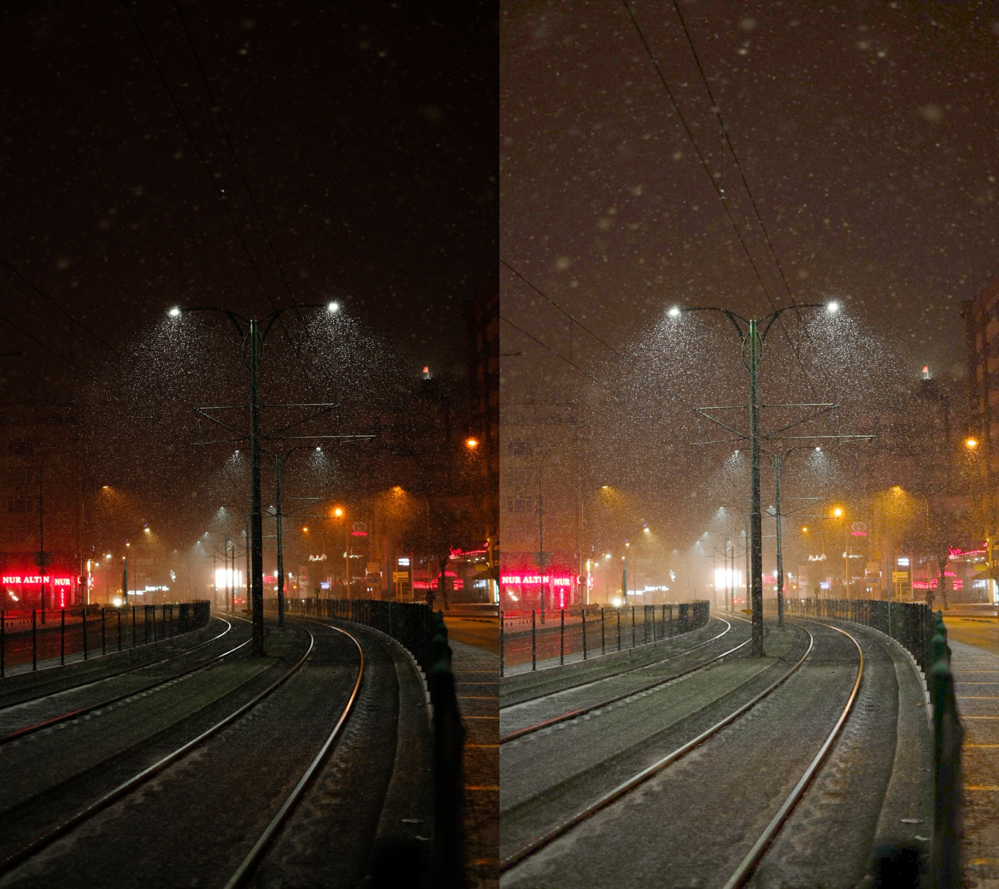

In [3]:
print(' Gamma Correction pada citra ')
print('-----------------------------')
try:
  gamma = float(input('Masukkan nilai gamma: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/pcvk_2026/night.jpeg')
gamma_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      val = 255 * ((original[y, x, c] / 255) ** gamma)
      gamma_image[y, x, c] = np.clip(val, 0, 255)

final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

--- Perbandingan: Sebelum (Kiri) vs Sesudah (Kanan) ---


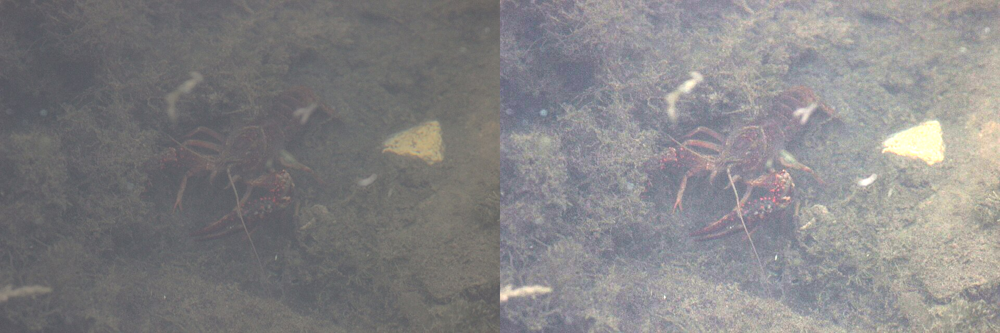

In [35]:
original = cv.imread('/content/drive/MyDrive/pcvk_2026/Images/crayfish.jpg')

alpha = 2.2
beta = -60

contrast_image = np.zeros(original.shape, original.dtype)
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      val = alpha * original[y, x, c] + beta
      contrast_image[y, x, c] = np.clip(val, 0, 255)

gamma = 1.3
enhanced_image = np.zeros(original.shape, original.dtype)
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      val = 255 * ((contrast_image[y, x, c] / 255.0) ** gamma)
      enhanced_image[y, x, c] = np.clip(val, 0, 255)

final_frame = cv.hconcat((original, enhanced_image))
print("--- Perbandingan: Sebelum (Kiri) vs Sesudah (Kanan) ---")
cv2_imshow(final_frame)